# MultiModal Embedding Models Exploration

In [1]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["__NV_PRIME_RENDER_OFFLOAD"] = "1"
os.environ["__GLX_VENDOR_LIBRARY_NAME"] = "nvidia"

## Gather Multimodal data

In [2]:
import requests

# Images and Text
url1 = "http://farm3.staticflickr.com/2519/4126738647_cc436c111b_z.jpg"
cap1 = "A motorcycle sits parked across from a herd of livestock"

url2 = "http://farm3.staticflickr.com/2046/2003879022_1b4b466d1d_z.jpg"
cap2 = "Motorcycle on platform to be worked on in garage"

url3 = "https://www.pacificcoast.com/on/demandware.static/-/Sites-pcf-master-catalog/default/dw9396be22/images/Pillows/prod-image_NP_HotelTOD_2_954.jpg"
cap3 = "a white pillow on a bed laying against other pillows"

img1 = {
    "flickr_url": url1,
    "caption": cap1,
    "image_path": "../data/raw/images/motorcycle_1.jpg",
}

img2 = {
    "flickr_url": url2,
    "caption": cap2,
    "image_path": "../data/raw/images/motorcycle_2.jpg",
}

img3 = {
    "flickr_url": url3,
    "caption": cap3,
    "image_path": "../data/raw/images/pillow_1.jpg",
}

# download images
imgs = [img1, img2, img3]
for img in imgs:
    data = requests.get(img["flickr_url"]).content
    with open(img["image_path"], "wb") as f:
        f.write(data)

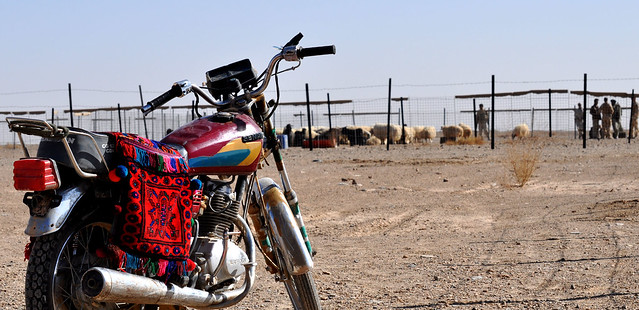

'A motorcycle sits parked across from a herd of livestock'

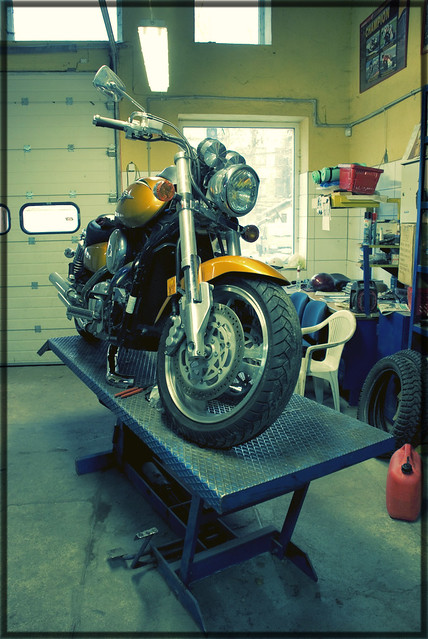

'Motorcycle on platform to be worked on in garage'

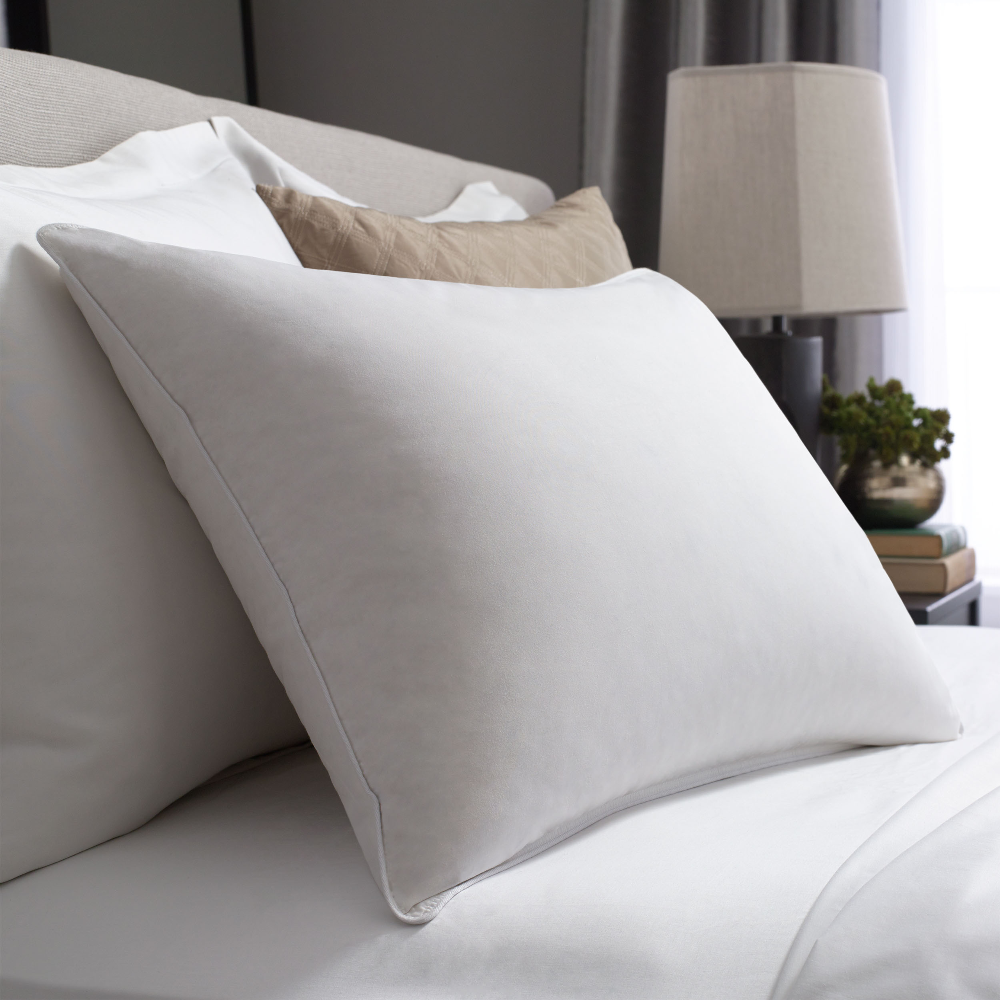

'a white pillow on a bed laying against other pillows'

In [3]:
from PIL import Image
from IPython.display import display

for img in [img1, img2, img3]:
    image = Image.open(img["image_path"])
    caption = img["caption"]
    display(image)
    display(caption)
    print()

## Compute Embedding

In [4]:
import numpy as np
from umap import UMAP
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import (
    cosine_similarity,
    euclidean_distances,
    pairwise_distances,
)
import pandas as pd
from tqdm import tqdm
from transformers import BridgeTowerProcessor, BridgeTowerModel
import torch
import matplotlib.pyplot as plt
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D  # Necessary for 3D plotting
import plotly.graph_objs as go

torch.cuda.empty_cache()
torch.cuda.memory.set_per_process_memory_fraction(0.95)  # Use 95% of available memory

/home/zalasyu/.cache/pypoetry/virtualenvs/multimodal-chatbot-gKQKVxne-py3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
processor = BridgeTowerProcessor.from_pretrained("BridgeTower/bridgetower-base-itm-mlm")

model = BridgeTowerModel.from_pretrained("BridgeTower/bridgetower-base-itm-mlm")
model.to(device)
model.eval()

BridgeTowerModel(
  (cross_modal_text_transform): Linear(in_features=768, out_features=768, bias=True)
  (cross_modal_image_transform): Linear(in_features=768, out_features=768, bias=True)
  (token_type_embeddings): Embedding(2, 768)
  (vision_model): BridgeTowerVisionModel(
    (visual): BridgeTowerVisionTransformer(
      (embeddings): BridgeTowerVisionEmbeddings(
        (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
        (position_embedding): Embedding(325, 768)
      )
      (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (transformer): BridgeTowerTransformer(
        (resblocks): ModuleList(
          (0-11): 12 x BridgeTowerResidualAttention(
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
            )
            (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
            (mlp): ModuleDict(
              (c

# Create Embeddings

In [6]:
embeddings_list = list()

# Load images
images = [Image.open(img["image_path"]) for img in [img1, img2, img3]]


for image in tqdm(images):
    encoding = processor(images=image, text=img["caption"], return_tensors="pt", padding=True)
    # Move tensors in 'encoding' to the device
    encoding = {key: value.to(device) for key, value in encoding.items()}
    with torch.no_grad():
        outputs = model(**encoding)
        print(outputs)
        embeddings = outputs.pooler_output
        print(embeddings.shape)
        embeddings_list.append(embeddings.cpu().numpy())

 67%|██████▋   | 2/3 [00:00<00:00,  3.23it/s]

BridgeTowerModelOutput(text_features=tensor([[[-0.0505,  0.2419, -0.0234,  ..., -0.0564,  0.2754,  0.3102],
         [ 0.8346,  0.1324, -0.2265,  ..., -0.3923, -0.4541,  0.7637],
         [-0.1870,  0.9293,  1.1489,  ..., -0.1740,  0.0275,  1.1488],
         ...,
         [-0.1804, -0.5790,  0.7264,  ...,  0.3214, -0.0468,  0.0749],
         [ 0.1781, -0.5232,  0.7632,  ..., -0.3454,  0.3382,  0.1033],
         [-0.0536,  0.2382, -0.0267,  ..., -0.0520,  0.2773,  0.3036]]],
       device='cuda:0'), image_features=tensor([[[ 0.7884,  0.4857, -0.8771,  ..., -1.7842, -0.8169, -2.3230],
         [ 1.2313,  0.2256, -0.4405,  ..., -1.8041, -0.7195, -2.6696],
         [ 1.3729,  0.2851, -0.1917,  ..., -2.1170, -0.3535, -1.2069],
         ...,
         [ 1.3703,  0.2958, -0.1715,  ..., -2.1188, -0.3342, -1.1816],
         [ 0.6484,  0.1984, -0.4406,  ..., -1.3167, -0.7813, -2.7938],
         [ 0.8544, -0.0540, -0.7683,  ..., -1.7762, -0.7272, -2.5523]]],
       device='cuda:0'), pooler_output=

100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

BridgeTowerModelOutput(text_features=tensor([[[-0.0149,  0.1451,  0.0604,  ..., -0.0471,  0.2504,  0.2576],
         [ 0.1253,  0.2672, -0.2118,  ..., -0.2483, -0.3131,  0.3761],
         [-0.4020,  0.0419,  0.4007,  ..., -0.3864, -0.4106,  0.6395],
         ...,
         [-0.1276, -1.0447,  0.8313,  ...,  0.0341, -0.2840,  0.0304],
         [ 0.2802, -1.0633,  0.4637,  ..., -0.2039,  0.2137, -0.0476],
         [-0.0157,  0.1428,  0.0627,  ..., -0.0427,  0.2515,  0.2565]]],
       device='cuda:0'), image_features=tensor([[[-0.2566, -0.3881, -0.2864,  ...,  0.3064,  1.2282,  1.9955],
         [ 0.8195,  0.2316,  0.4764,  ...,  1.2481,  0.3403,  0.4886],
         [ 0.1401, -0.6239,  1.4018,  ...,  0.9071,  0.9583,  1.0844],
         ...,
         [ 1.1043,  0.2915, -0.5870,  ...,  0.3508, -1.0058, -0.5043],
         [ 1.6060,  0.3821, -0.4553,  ...,  0.0391, -0.7251, -0.8187],
         [ 0.9309,  0.5751, -0.8793,  ..., -0.0237, -0.4559, -0.4944]]],
       device='cuda:0'), pooler_output=

In [7]:
print(f"Here is the first embedding: {embeddings_list[0]}")
print(f"The length of the embedding is: {len(embeddings_list[0][0])}")

Here is the first embedding: [[ 0.08160079  0.85036427  0.02066107 ... -0.01687745 -0.99351215
   0.9960121 ]]
The length of the embedding is: 1536


In [8]:
# Vertically stack the embeddings
embeddings = np.vstack(embeddings_list)
print(f"Here is the first embedding: {embeddings[0]}")
print(f"The length of the embedding is: {len(embeddings[0])}")

Here is the first embedding: [ 0.08160079  0.85036427  0.02066107 ... -0.01687745 -0.99351215
  0.9960121 ]
The length of the embedding is: 1536


In [9]:
# Normalize the embeddings using L2 norm
embeddings_normalized = normalize(embeddings, norm="l2")
print(f"Embeddings Normalized from first embedding: {embeddings_normalized[0]}")

Embeddings Normalized from first embedding: [ 0.00335199  0.03493121  0.00084871 ... -0.00069329 -0.04081143
  0.04091412]


## Compute Similarity Measures

In [10]:
cosine_sim_matrix = cosine_similarity(embeddings_normalized)
print(f"Here is the cosine similarity matrix: {cosine_sim_matrix[0]}")

Here is the cosine similarity matrix: [ 1.          0.96111387 -0.22966018]


In [11]:
euclidean_dist_matrix = euclidean_distances(embeddings_normalized)
print(f"Here is the euclidean distance matrix: {euclidean_dist_matrix[0]}")

Here is the euclidean distance matrix: [0.        0.2788763 1.568222 ]


In [12]:
p = 3
minkwoski_dist_matrix = pairwise_distances(embeddings_normalized, metric="minkowski", p=p)
print(f"Here is the minkowski distance matrix: {minkwoski_dist_matrix[0]}")

Here is the minkowski distance matrix: [0.         0.12636454 0.57089594]


## Visualize Embeddings with Bigger Dataset

In [13]:
from datasets import load_dataset

ds = load_dataset("nlphuji/flickr30k")

In [14]:
# Display the first few rows of the dataset
print(ds["test"])

Dataset({
    features: ['image', 'caption', 'sentids', 'split', 'img_id', 'filename'],
    num_rows: 31014
})


['A man holding a sign and a blond woman are embracing outdoors.',
 'A man in green holding a sign hugs a blond woman.',
 'A girl and guy holding signs and hugging.',
 'Man with sign hugging woman.',
 'A man and a woman hugging.']

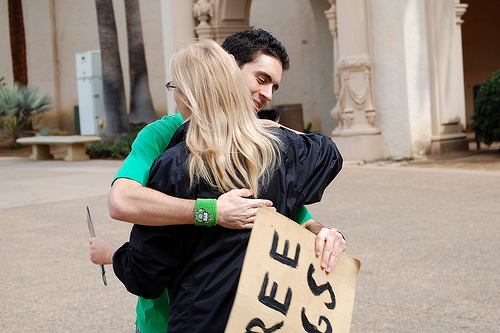

['Two men one in a red shirt and the other wearing a yellow shirt are in a lab.',
 'Two men, one in a red shirt and the other in yellow, clean a laboratory.',
 '2 males, one in a red shirt and one in a yellow shirt, cleaning a room.',
 'Two male students clean in a lab with the chairs upturned on the tables.',
 'Two men cleaning a science laboratory.']

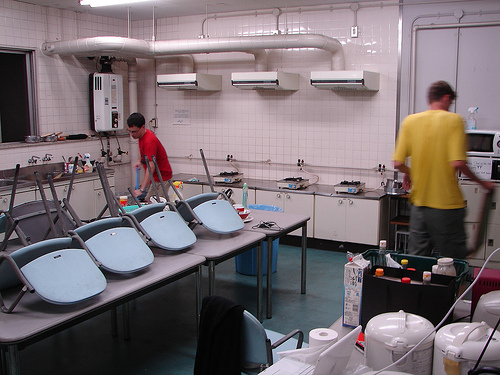

['An artist kneels to work on a mural of a child hugging a tree while another woman looks on.',
 'A woman painting a mural on the wall while another woman supervises.',
 'A woman in blue top and tan paints painting a child hugging tree.',
 'A hefty man in a blue shirt painting on a wall.',
 'Women painting mural on wall.']

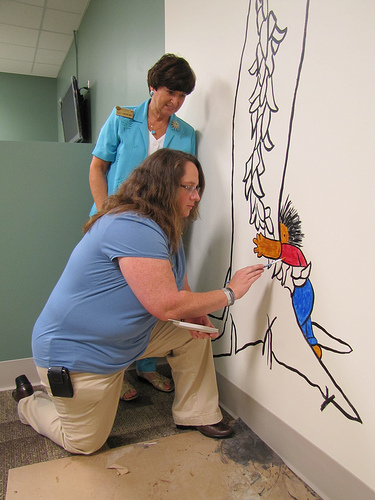

['A woman in a white hat and gray scarf stares and smiles at a man completely covered in pewter colored paint.',
 'A man who is dressed and painted in all gray is standing like a statue.',
 'A woman stares at a gray statue she passes while walking.',
 'People are walking by an all gray statue.',
 'A man all in gray is a living statue.']

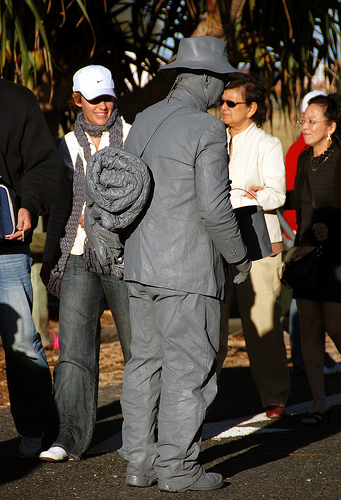

['This is a mother embracing her newborn child in the hospital for the first time.',
 'A young woman holding her newborn baby in a hospital bed.',
 'A blond-haired mother is holding her newborn baby.',
 'A lady on a hospital bed is holding a baby.',
 'A mother holds her newborn baby.']

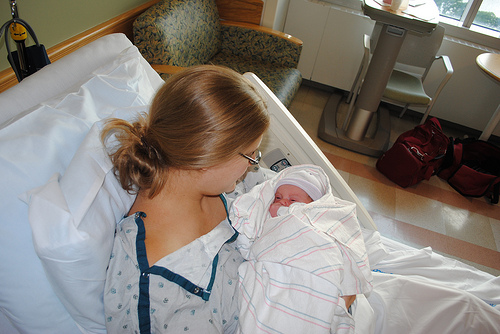

['Woman pushes her two young boys both in red in stroller by the train.',
 'Young children and adults walk around platform 9 next to the train.',
 'A woman pushing two children are walking beside a large train.',
 'Many people are walking along side an old steam engine.',
 'A woman and her children departing a train.']

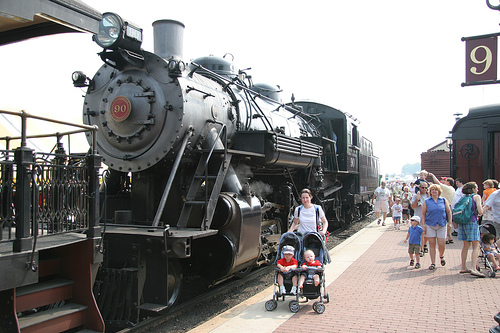

In [15]:
from IPython.display import display

# Select a subset of the dataset
subset = ds["test"].shuffle(seed=13).select(range(20014))

# Display a few samples
for i, item in enumerate(subset):
    display(item["caption"])
    display(item["image"])
    if i >= 5:
        break

In [16]:
import concurrent.futures


# Define a function to extract image and caption
def extract_image_caption(img):
    return img["image"], img["caption"]


# Use ThreadPoolExecutor to parallelize the process
with concurrent.futures.ThreadPoolExecutor() as executor:
    results = list(executor.map(extract_image_caption, subset))

# Unpack the results into separate lists
images, captions = zip(*results)

# Convert the tuples back to lists if needed
images = list(images)
captions = list(captions)

print(len(images))
print(len(captions))

20014
20014


In [17]:
images_list = list()
concatenated_captions = list()

for image, caption_list in zip(images, captions):
    # Concatenate all captions into one string
    concatenated_caption = " ".join(caption_list)
    images_list.append(image)
    concatenated_captions.append(concatenated_caption)

# Generate embeddings by batch
embeddings_list = list()

In [18]:
# Set dynamic batch size based on available GPU memory
batch_size = 40
max_gpu_memory = torch.cuda.get_device_properties(0).total_memory
used_memory = torch.cuda.memory_allocated()
free_memory = max_gpu_memory - used_memory
# Adjust the batch size to ensure that the GPU memory is not exceeded
batch_size = int(min(batch_size, free_memory // (len(images_list) * 0.7)))
print(f"Batch size: {batch_size}")

Batch size: 40


In [19]:
# Initialize a list to store embeddings
embeddings_list = []

for i in tqdm(range(0, len(images_list), batch_size)):
    batch_images = images_list[i : i + batch_size]
    batch_captions = concatenated_captions[i : i + batch_size]

    # Preprocess inputs
    encoding = processor(text=batch_captions, images=batch_images, return_tensors="pt", padding=True)
    # Move tensors in 'encoding' to the device
    encoding = {key: value.to(device) for key, value in encoding.items()}

    with torch.no_grad():
        outputs = model(**encoding)
        # Extract embeddings (pooler_output has shape [batch_size, 1526])
        embeddings = outputs.pooler_output
        embeddings_list.append(embeddings)

100%|██████████| 501/501 [22:41<00:00,  2.72s/it]


In [20]:
# Concatenate and normalize the embeddings
embeddings_tensor = torch.cat(embeddings_list, dim=0)
embeddings_array = embeddings_tensor.cpu().numpy()
embeddings_normalized = normalize(embeddings_array, norm="l2")

In [21]:
umap_reducer = UMAP(n_components=3, metric="cosine", n_jobs=-1)
embeddings_umap = umap_reducer.fit_transform(embeddings_normalized)

In [21]:
from sklearn.cluster import SpectralClustering

# Decide on the number of clusters
num_clusters = 15  # Adjust as needed

# Apply k-means clustering
spectral = SpectralClustering(
    n_clusters=num_clusters,
    affinity="nearest_neighbors",
    assign_labels="kmeans",
    n_jobs=-1,
    n_neighbors=10,
)
cluster_labels = spectral.fit_predict(embeddings_normalized)

In [22]:
# Prepare data for Plotly
df = pd.DataFrame(
    {
        "Dimension 1": embeddings_umap[:, 0],
        "Dimension 2": embeddings_umap[:, 1],
        "Dimension 3": embeddings_umap[:, 2],
        "Cluster": cluster_labels,
        "Caption": concatenated_captions,
    }
)

In [23]:
# Create a 3D scatter plot
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=df["Dimension 1"],
            y=df["Dimension 2"],
            z=df["Dimension 3"],
            mode="markers",
            marker=dict(color=df["Cluster"], size=2),
            text=df["Caption"],
        )
    ]
)

fig.update_layout(
    title="Interactive 3D UMAP Projection",
    scene=dict(xaxis_title="Dimension 1", yaxis_title="Dimension 2", zaxis_title="Dimension 3"),
    width=1300,
    height=1300,
)

# Show the plot
fig.show()

### t-SNE Visualization

In [24]:
from sklearn.manifold import TSNE

In [25]:
# Initialize the t-SNE model
tsne = TSNE(n_components=3, random_state=42, perplexity=100, n_iter=1000)

In [26]:
# Reduce the dimensionality of the embeddings
embeddings_tsne = tsne.fit_transform(embeddings_normalized)

/home/zalasyu/.cache/pypoetry/virtualenvs/multimodal-chatbot-gKQKVxne-py3.12/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



In [27]:
# Prepare data for Plotly
df_tsne = pd.DataFrame(
    {
        "Dimension 1": embeddings_tsne[:, 0],
        "Dimension 2": embeddings_tsne[:, 1],
        "Dimension 3": embeddings_tsne[:, 2],
        "Cluster": cluster_labels,
    }
)

In [28]:
# Create a 3D scatter plot
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=df_tsne["Dimension 1"],
            y=df_tsne["Dimension 2"],
            z=df_tsne["Dimension 3"],
            mode="markers",
            marker=dict(color=df["Cluster"], size=2),
            text=df["Cluster"],
        )
    ]
)

fig.update_layout(
    title="Interactive 3D UMAP Projection",
    scene=dict(xaxis_title="Dimension 1", yaxis_title="Dimension 2", zaxis_title="Dimension 3"),
    width=1300,
    height=600,
)

# Show the plot
fig.show()